# Task 3_Shape Verification (Circle + Triangle + Rectangle)

- **Mục tiêu:** Task 2 (Union box HSV + MSER + Canny/Hull) sinh ứng viên dựa trên màu sắc/kết cấu, nhưng không nhận dạng hình dạng, một box từ Task 2 có thể là biển tròn, tam giác, chữ nhật, hoặc nhiễu nền có màu tương tự (bounding box luôn là hình chữ nhật bao ngoài, bất kể shape thật bên trong là gì, nên không thể coi box "vuông vức" là bằng chứng đã xác nhận đúng biển chữ nhật). Task 4 bổ sung 3 nhánh phát hiện chuyên biệt theo hình dạng thật tương ứng với 3 nhóm biển báo:
    - **Circle** (Hough Transform + fitEllipse cho trường hợp nghiêng góc chụp): Biển cấm `P.*` và biển hiệu lệnh `R.*`
    - **Triangle** (Polygon Approximation): Biển báo nguy hiểm `W.*`
    - **Rectangle** (Polygon Approximation): Biển chỉ dẫn/phụ `I.*`, `S.*`

- Lý do cần nhận dạng riêng cho từng nhóm là vì mỗi kỹ thuật hình học chỉ đặc hiệu cho đúng 1 dạng đường viền (Hough Circle chỉ dò được đường tròn, approxPolyDP chỉ tổng quát cho đa giác N đỉnh), nên tách theo hình dạng giúp bắt được các trường hợp Task 2 dễ bỏ sót hoặc lẫn nhiễu:
    - Biển có nền màu lớn, đồng nhất dễ bị Edge+Hull ở Task 2 gộp nhầm với nền xung quanh cùng màu.
    - Biển bị chói sáng/ngược sáng làm sai lệch màu thật, khiến ngưỡng HSV bỏ sót.
    - Biển nhỏ/ở xa khiến contour từ Canny bị đứt đoạn, Convex Hull không khép kín đúng hình dạng.
    - Nhiễu nền tình cờ có màu giống biển báo nhưng hình dạng hình học không khớp bất kỳ shape nào ở trên -> bị loại ở bước này thay vì trôi tới tận Task 6-7.

- **Input / Output:**
    - Input: Ảnh gốc đã qua Task 1.
    - Output: Với mỗi ảnh, 3 file JSON riêng theo từng nhánh (`circles/`, `triangles/`, `rectangles/`), sau đó gộp lại thành 1 file JSON thống nhất với `{bounding_box, confidence, source}` mỗi ảnh, làm nguồn ứng viên bổ sung song song với Task 2 (union box), cùng đưa vào Task 5 (ROI extraction).


- **Nguyên tắc:** cả 3 nhánh đều ưu tiên **recall**, nhưng bước gộp cuối (multi-scale merge) có trách nhiệm giảm nhiễu trùng lặp mà không đánh đổi recall thật.

- **Quy trình thực hiện:**
  1. Import, thiết lập đường dẫn, ánh xạ class -> hình dạng, tải ảnh khảo sát (dùng chung cho cả 3 nhánh).
  2. Circle: Minh hoạ mặc định -> ước lượng radius từ GT -> khảo sát `param1`/`param2` (main pass) -> đánh giá định lượng việc bổ sung small-circle pass + ellipse branch cùng cơ chế dedup mới -> chọn cấu hình pipeline cuối -> kiểm tra định tính -> xuất JSON.
  3. Triangle & Rectangle: Minh hoạ mặc định -> khảo sát `approx_eps_ratio` -> chọn bộ lọc phụ (`side_ratio_tol`/`angle_tol`/màu/containment-dedup) -> kiểm tra lại -> xuất JSON.
  4. Gộp kết quả: Merge 3 JSON thành 1 file/ảnh cho Task 5, lưu toàn bộ tham số vào `config.yaml` dưới khoá `task4_shape`.

# 1. Import thư viện

In [28]:
from pathlib import Path
import sys
import random
import json
import yaml
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 2. Thiết lập đường dẫn

In [29]:
CURRENT_DIR = Path.cwd()
PROJECT_ROOT = CURRENT_DIR.parent if CURRENT_DIR.name == "notebooks" else CURRENT_DIR
sys.path.append(str(PROJECT_ROOT))

from src.data_loader import load_config, list_image_paths, get_image_dirs, save_config
from src.utils import show_images, read_label_boxes, match_boxes
from src.hough_detection import preprocess_for_hough, detect_circles, draw_circles
from src.polygon_detection import preprocess_for_polygon, detect_polygons, draw_polygons
CFG, PROJECT_ROOT, CONFIG_PATH = load_config(PROJECT_ROOT)
IMAGE_DIR_RAW, LABEL_DIR = get_image_dirs(CFG, PROJECT_ROOT)

PROCESSED_IMAGE_DIR = PROJECT_ROOT / "data" / "processed" / "task1_preprocessing" / "images"

OUTPUT_TASK3_DIR   = PROJECT_ROOT / "data" / "processed" / "task3_shape"
CIRCLE_JSON_DIR    = OUTPUT_TASK3_DIR / "circles"
TRIANGLE_JSON_DIR  = OUTPUT_TASK3_DIR / "triangles"
RECTANGLE_JSON_DIR = OUTPUT_TASK3_DIR / "rectangles"
MERGED_JSON_DIR    = OUTPUT_TASK3_DIR / "merged"

for d in [CIRCLE_JSON_DIR, TRIANGLE_JSON_DIR, RECTANGLE_JSON_DIR, MERGED_JSON_DIR]:
    d.mkdir(parents=True, exist_ok=True)

assert PROCESSED_IMAGE_DIR.exists(), f"Không tìm thấy: {PROCESSED_IMAGE_DIR}. Hãy chạy 01_task1_preprocessing.ipynb trước."

print(f"PROCESSED_IMAGE_DIR (input) : {PROCESSED_IMAGE_DIR}")
print(f"CIRCLE_JSON_DIR    (output) : {CIRCLE_JSON_DIR}")
print(f"TRIANGLE_JSON_DIR  (output) : {TRIANGLE_JSON_DIR}")
print(f"RECTANGLE_JSON_DIR (output) : {RECTANGLE_JSON_DIR}")
print(f"MERGED_JSON_DIR    (output) : {MERGED_JSON_DIR}")

PROCESSED_IMAGE_DIR (input) : c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task1_preprocessing\images
CIRCLE_JSON_DIR    (output) : c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\circles
TRIANGLE_JSON_DIR  (output) : c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\triangles
RECTANGLE_JSON_DIR (output) : c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\rectangles
MERGED_JSON_DIR    (output) : c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\merged


# 3. Ánh xạ class -> hình dạng (dùng chung cho cả 3 nhánh)

In [30]:
def infer_shape(code):
    return {"P": "circle", "R": "circle", "W": "triangle", "I": "rectangle", "S": "rectangle"}.get(
        code.split("*")[0].split(".")[0], "unknown"
    )

with open(PROJECT_ROOT / "data" / "raw" / "classes.txt", encoding="utf-8") as f:
    id_to_shape = {i: infer_shape(l.strip()) for i, l in enumerate(f) if l.strip()}

def filter_gt_by_shape(gt_list, shape, id_to_shape=id_to_shape):
    """Giữ lại GT box thuộc đúng 1 shape (vd. 'circle'/'triangle'/'rectangle'),
    dùng cho mọi bước tuning/eval ở cả Phần A và Phần B."""
    return [g for g in gt_list if id_to_shape.get(g["class"], "unknown") == shape]

print(f"Đã nạp id_to_shape cho {len(id_to_shape)} class.")
print("Số class theo shape:", {s: list(id_to_shape.values()).count(s) for s in set(id_to_shape.values())})

Đã nạp id_to_shape cho 52 class.
Số class theo shape: {'rectangle': 6, 'unknown': 2, 'triangle': 18, 'circle': 26}


# 4. Tải 5 ảnh khảo sát

Đã tải 5 ảnh mẫu từ Task 1.


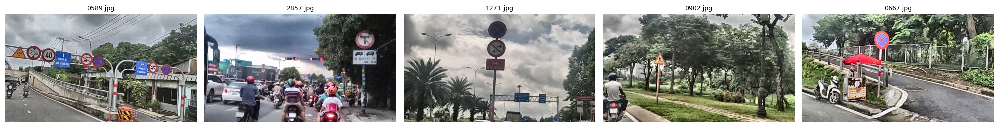

In [31]:
QUALITATIVE_JSON_PATH = PROJECT_ROOT / "data" / "interim" / "qualitative_check_images.json"

assert QUALITATIVE_JSON_PATH.exists(), (
    f"Không tìm thấy {QUALITATIVE_JSON_PATH}. Hãy chạy mục '5 ảnh ngẫu nhiên cố định' "
    f"trong 01_task1_preprocessing.ipynb trước."
)

with open(QUALITATIVE_JSON_PATH, "r", encoding="utf-8") as f:
    sample_names = json.load(f)

survey_paths = [PROCESSED_IMAGE_DIR / name for name in sample_names]

for p in survey_paths:
    assert p.exists(), f"Không tìm thấy: {p}. Kiểm tra lại tên file trong {PROCESSED_IMAGE_DIR}."

survey_images = [cv2.imread(str(p)) for p in survey_paths]
survey_titles = [p.name for p in survey_paths]

print(f"Đã tải {len(survey_images)} ảnh mẫu từ Task 1.")
show_images(survey_images, survey_titles, figsize=(20, 4))

# 5. Circle Detection (Hough Circle Transform + Ellipse)

Xác nhận hình dạng **tròn** cho nhóm biển cấm `P.*` và biển hiệu lệnh `R.*`.

## 5.1. Ước lượng min_radius/max_radius từ chính GT box

In [32]:
random.seed(42)
all_img_paths = list_image_paths(PROCESSED_IMAGE_DIR)
eval_paths = random.sample(all_img_paths, min(150, len(all_img_paths)))

gt_diagonals = []
for path in eval_paths:
    img = cv2.imread(str(path))
    if img is None:
        continue
    gt_boxes = read_label_boxes(LABEL_DIR / f"{path.stem}.txt", img.shape)
    gt_boxes = filter_gt_by_shape(gt_boxes, "circle")   # chỉ lấy GT hình tròn
    for gt in gt_boxes:
        diag = ((gt["w"] ** 2 + gt["h"] ** 2) ** 0.5)
        gt_diagonals.append(diag / 2)

gt_diagonals = np.array(gt_diagonals)
p10, p50, p90 = np.percentile(gt_diagonals, [10, 50, 90])
print(f"Bán kính ước lượng từ GT (chỉ class hình tròn, n={len(gt_diagonals)}): p10={p10:.1f}, p50={p50:.1f}, p90={p90:.1f}")

# Recall-first: nới khoảng bán kính rộng hơn so với p10*0.8/p90*1.2 trước đây,
# để không loại nhầm biển hơi nhỏ/hơi to hơn phân vị mẫu.
MIN_RADIUS = max(int(p10 * 0.6), 4)
MAX_RADIUS = int(p90 * 1.35)
print(f"-> MIN_RADIUS={MIN_RADIUS}, MAX_RADIUS={MAX_RADIUS}")


Bán kính ước lượng từ GT (chỉ class hình tròn, n=284): p10=10.7, p50=23.3, p90=55.3
-> MIN_RADIUS=6, MAX_RADIUS=74


## 5.2. Hàm đánh giá định lượng (Recall/Precision so với GT)

Định nghĩa 1 lần, dùng lại cho mọi bước tuning bên dưới (main pass đơn lẻ lẫn pipeline gộp nhiều nhánh).

In [33]:
def evaluate_hough_params(image_paths, label_dir, shape_filter="circle", **hough_kwargs):
    total_matched = total_gt = total_pred = n_images = 0
    for path in image_paths:
        img = cv2.imread(str(path))
        if img is None:
            continue
        gt_raw = read_label_boxes(label_dir / f"{path.stem}.txt", img.shape)
        if shape_filter is not None:
            gt_raw = filter_gt_by_shape(gt_raw, shape_filter)   # chỉ đánh giá trên GT đúng shape
        if not gt_raw:
            continue
        n_images += 1
        gt_boxes = [(b["x1"], b["y1"], b["x2"], b["y2"]) for b in gt_raw]

        gray = preprocess_for_hough(img)
        circles = detect_circles(gray, image_bgr=img, **hough_kwargs)
        pred_boxes = [(c["bounding_box"][0], c["bounding_box"][1],
                       c["bounding_box"][0] + c["bounding_box"][2],
                       c["bounding_box"][1] + c["bounding_box"][3]) for c in circles]

        n_matched, n_gt, n_pred = match_boxes(pred_boxes, gt_boxes, iou_threshold=0.3)
        total_matched += n_matched
        total_gt += n_gt
        total_pred += n_pred

    recall = total_matched / total_gt if total_gt else 0.0
    precision = total_matched / total_pred if total_pred else 0.0
    avg_pred = total_pred / n_images if n_images else 0.0
    return {"recall": recall, "precision": precision, "avg_pred_per_image": avg_pred}

## 5.3. Khảo sát param1/param2

In [34]:
# Grid 2D -- param1 x param2
PARAM1_CANDIDATES = [80, 100, 120]
PARAM2_CANDIDATES = [20, 30, 40, 50]

In [14]:
sweep_grid = {}
print(f"{'param1':<8} | {'param2':<8} | {'Recall':<8} | {'Precision':<10} | {'Avg pred/ảnh'}")
for param1 in PARAM1_CANDIDATES:
    for param2 in PARAM2_CANDIDATES:
        res = evaluate_hough_params(eval_paths, LABEL_DIR, dp=1.2, min_dist=30,
                                     param1=param1, param2=param2,
                                     min_radius=MIN_RADIUS, max_radius=MAX_RADIUS)
        sweep_grid[(param1, param2)] = res
        print(f"{param1:<8} | {param2:<8} | {res['recall']:<8.4f} | {res['precision']:<10.4f} | {res['avg_pred_per_image']:.2f}")

param1   | param2   | Recall   | Precision  | Avg pred/ảnh
80       | 20       | 0.4613   | 0.0027     | 436.44
80       | 30       | 0.4718   | 0.0036     | 332.06
80       | 40       | 0.4507   | 0.0051     | 221.96
80       | 50       | 0.3838   | 0.0078     | 123.45
100      | 20       | 0.4859   | 0.0030     | 412.92
100      | 30       | 0.4859   | 0.0041     | 300.11
100      | 40       | 0.4930   | 0.0066     | 186.57
100      | 50       | 0.3697   | 0.0099     | 94.22
120      | 20       | 0.4754   | 0.0030     | 392.89
120      | 30       | 0.4789   | 0.0044     | 272.87
120      | 40       | 0.4930   | 0.0079     | 157.73
120      | 50       | 0.3521   | 0.0122     | 72.65


**Nhận xét:** 120x40 mặc dù recall cao thứ 2 nhưng lại cho avg pred/ảnh nhỏ hơn so với 100x40 và 120x30 -> Chọn 120x40

In [35]:
CANDIDATE_PARAM1 = 120
CANDIDATE_PARAM2 = 40

best_hough_params = dict(
    dp=1.2,
    min_dist=25,
    param1=CANDIDATE_PARAM1,
    param2=CANDIDATE_PARAM2,
    min_radius=MIN_RADIUS,
    max_radius=MAX_RADIUS
)

print("best_hough_params =", best_hough_params)


best_hough_params = {'dp': 1.2, 'min_dist': 25, 'param1': 120, 'param2': 40, 'min_radius': 6, 'max_radius': 74}


# 5.4. Kiểm tra định tính kết quả ảnh sau khi đã áp dụng bộ tham số tốt nhất

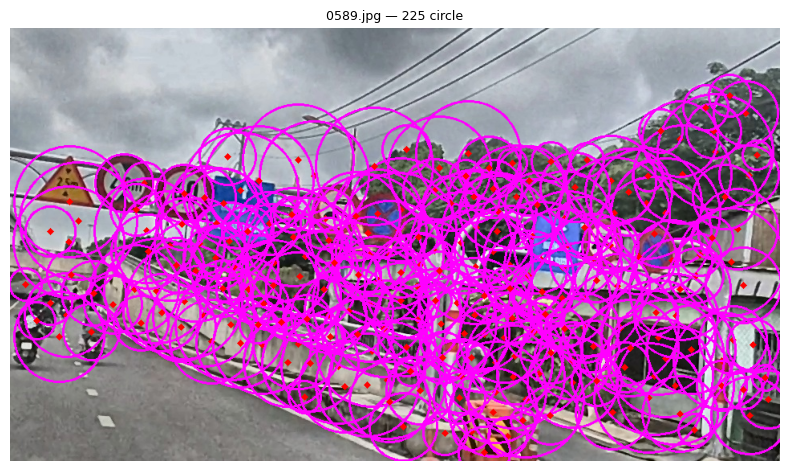

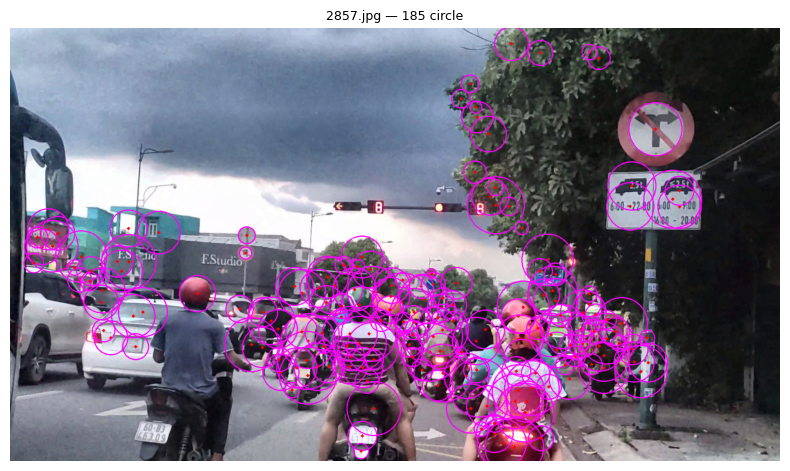

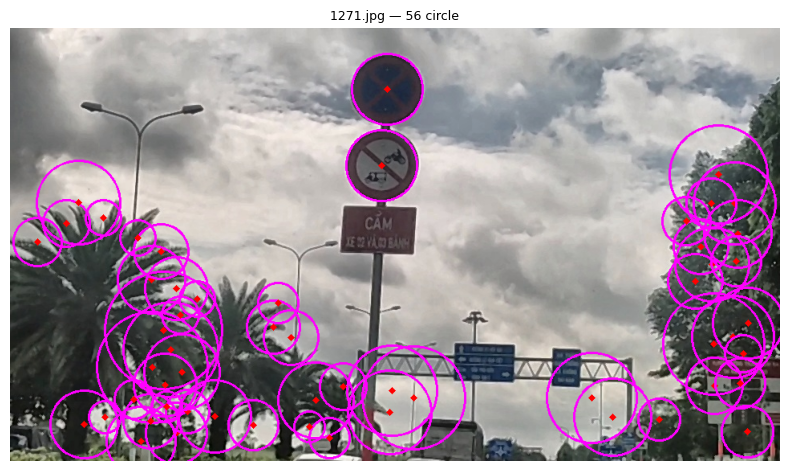

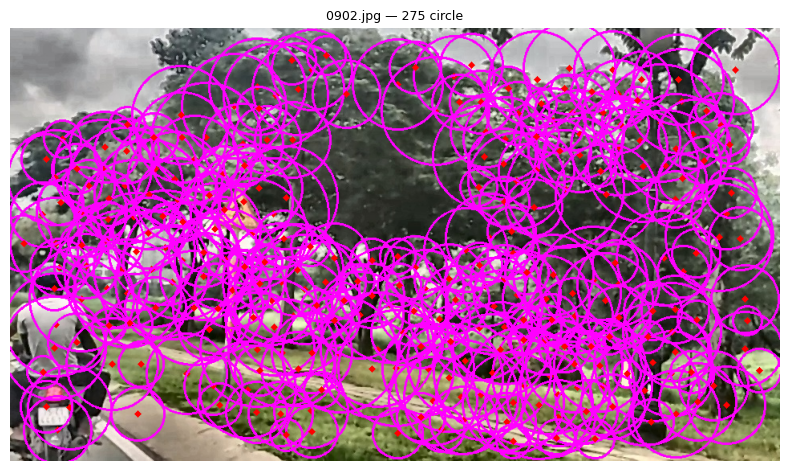

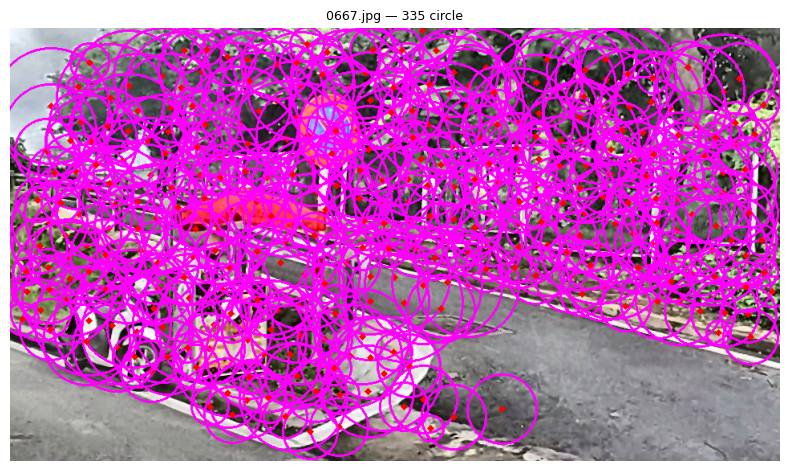

In [36]:
for img, title in zip(survey_images, survey_titles):
    gray = preprocess_for_hough(img)
    circles = detect_circles(gray, image_bgr=img, **best_hough_params)
    result = draw_circles(img, circles)
    show_images([result], [f"{title} — {len(circles)} circle"],
                figsize=(8, 5))

## 5.8. Áp dụng lên toàn bộ dataset & xuất JSON circle

In [37]:
all_img_paths_full = list_image_paths(PROCESSED_IMAGE_DIR)
print(f"Bắt đầu xử lý {len(all_img_paths_full)}")

for path in all_img_paths_full:
    img = cv2.imread(str(path))
    if img is None:
        continue
    gray = preprocess_for_hough(img)
    circles = detect_circles(gray, image_bgr=img, **best_hough_params)

    json_path = CIRCLE_JSON_DIR / f"{path.stem}.json"
    with open(json_path, "w", encoding="utf-8") as f:
        json.dump(circles, f)

print(f"Đã xuất JSON vòng tròn -> {CIRCLE_JSON_DIR}")

Bắt đầu xử lý 2532
Đã xuất JSON vòng tròn (circle + ellipse) -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\circles


# 6. Triangle & Rectangle Detection (Polygon Approximation)

## 6.1. Khảo sát tham số approx_eps_ratio

approx_eps_ratio quyết định epsilon của `cv2.approxPolyDP` (epsilon = tỉ lệ này × chu vi contour), đây là tham số quan trọng của toàn bộ phần 6, tương tự vai trò `param1`/`param2` bên Hough:
- **eps nhỏ**: contour giữ nguyên nhiều đỉnh (răng cưa do nhiễu Canny), khó khớp đúng 3 hoặc 4 đỉnh mong muốn -> recall thấp.
- **eps lớn**: làm tròn quá tay, có thể gộp nhầm contour phức tạp thành đúng 3-4 đỉnh dù không phải tam giác/chữ nhật thật -> precision thấp (nhiều box rác lọt qua vì "vừa đủ" 3-4 đỉnh).

Khảo sát trên *GT được lọc theo đúng shape (`filter_gt_by_shape`), giống hệt cách làm ở phần 5.

In [38]:
def evaluate_polygon_params(image_paths, label_dir, target_sides, **poly_kwargs):
    shape_filter = "triangle" if target_sides == 3 else "rectangle"
    total_matched = total_gt = total_pred = n_images = 0
    for path in image_paths:
        img = cv2.imread(str(path))
        if img is None:
            continue
        gt_raw = read_label_boxes(label_dir / f"{path.stem}.txt", img.shape)
        gt_raw = filter_gt_by_shape(gt_raw, shape_filter)   # chỉ đánh giá trên GT đúng shape
        if not gt_raw:
            continue
        n_images += 1
        gt_boxes = [(b["x1"], b["y1"], b["x2"], b["y2"]) for b in gt_raw]
        gray = preprocess_for_polygon(img)

        polys = detect_polygons(gray, image_bgr=img, target_sides=target_sides, **poly_kwargs)
        pred_boxes = [(p["bounding_box"][0], p["bounding_box"][1],
                       p["bounding_box"][0] + p["bounding_box"][2],
                       p["bounding_box"][1] + p["bounding_box"][3]) for p in polys]

        n_matched, n_gt, n_pred = match_boxes(pred_boxes, gt_boxes, iou_threshold=0.3)
        total_matched += n_matched
        total_gt += n_gt
        total_pred += n_pred

    recall = total_matched / total_gt if total_gt else 0.0
    precision = total_matched / total_pred if total_pred else 0.0
    avg_pred = total_pred / n_images if n_images else 0.0
    return {"recall": recall, "precision": precision, "avg_pred_per_image": avg_pred}

In [39]:
EPS_RATIO_CANDIDATES = [0.01, 0.02, 0.03, 0.05, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18]

print("--- Sweep approx_eps_ratio cho TRIANGLE (GT: shape=triangle) ---")
sweep_triangle = {}
print(f"{'eps_ratio':<10} | {'Recall':<8} | {'Precision':<10} | {'Avg pred/ảnh'}")
for eps in EPS_RATIO_CANDIDATES:
    res = evaluate_polygon_params(eval_paths, LABEL_DIR, target_sides=3, approx_eps_ratio=eps)
    sweep_triangle[eps] = res
    print(f"{eps:<10} | {res['recall']:<8.4f} | {res['precision']:<10.4f} | {res['avg_pred_per_image']:.2f}")

print()
print("--- Sweep approx_eps_ratio cho RECTANGLE (GT: shape=rectangle) ---")
sweep_rectangle = {}
print(f"{'eps_ratio':<10} | {'Recall':<8} | {'Precision':<10} | {'Avg pred/ảnh'}")
for eps in EPS_RATIO_CANDIDATES:
    res = evaluate_polygon_params(eval_paths, LABEL_DIR, target_sides=4, approx_eps_ratio=eps)
    sweep_rectangle[eps] = res
    print(f"{eps:<10} | {res['recall']:<8.4f} | {res['precision']:<10.4f} | {res['avg_pred_per_image']:.2f}")

--- Sweep approx_eps_ratio cho TRIANGLE (GT: shape=triangle) ---
eps_ratio  | Recall   | Precision  | Avg pred/ảnh
0.01       | 0.0233   | 0.0870     | 0.34
0.02       | 0.0465   | 0.0444     | 1.34
0.03       | 0.0814   | 0.0256     | 4.07
0.05       | 0.1977   | 0.0125     | 20.33
0.08       | 0.3488   | 0.0070     | 64.37
0.1        | 0.3953   | 0.0061     | 83.60
0.12       | 0.4419   | 0.0065     | 87.79
0.14       | 0.4302   | 0.0071     | 78.13
0.16       | 0.3605   | 0.0080     | 57.97
0.18       | 0.3256   | 0.0125     | 33.39

--- Sweep approx_eps_ratio cho RECTANGLE (GT: shape=rectangle) ---
eps_ratio  | Recall   | Precision  | Avg pred/ảnh
0.01       | 0.2273   | 0.1000     | 2.38
0.02       | 0.4091   | 0.0398     | 10.76
0.03       | 0.5000   | 0.0192     | 27.24
0.05       | 0.5455   | 0.0083     | 69.14
0.08       | 0.6818   | 0.0090     | 79.48
0.1        | 0.6818   | 0.0121     | 59.14
0.12       | 0.5455   | 0.0158     | 36.19
0.14       | 0.3636   | 0.0228     | 16.

**Nhận xét:**

- **Triangle:** Recall tăng gần như đơn điệu theo eps, đạt đỉnh **0.4419 tại `eps=0.12`** cao nhất toàn dải sweep. Đáng chú ý, precision tại `eps=0.12` (0.0065) còn nhỉnh hơn cả `eps=0.10` (0.0061), tức `eps=0.12` vượt trội `eps=0.10` trên cả hai chỉ số, không phải đánh đổi. Từ `eps=0.14` trở đi, recall bắt đầu giảm (0.4302 → 0.3605 → 0.3256) dù precision nhích lên do sinh ít box hơn, nhưng phần recall mất đi (các biển tam giác không còn được phát hiện) quan trọng hơn nhiều so với việc giảm nhiễu ở giai đoạn sinh ứng viên (ưu tiên recall, lọc nhiễu là việc của SVM Tầng 1). Do đó `eps=0.12` là lựa chọn tối ưu.

- **Rectangle:** Recall đạt đỉnh chung **0.6818** ở cả `eps=0.08` và `eps=0.10`, nhưng `eps=0.10` cho precision cao hơn hẳn (0.0121 so với 0.0090) và sinh ít box hơn nhiều (59.14 so với 79.48 box/ảnh). Cùng recall mà `eps=0.08` chỉ tốn thêm nhiễu, nên bị loại. So với các mốc eps nhỏ hơn (`0.05`: recall 0.5455, precision 0.0083; `0.03`: recall 0.5000), `eps=0.10` cũng vượt trội cả hai chỉ số. Từ `eps=0.12` trở đi recall tụt nhanh (0.5455 → 0.3636 → 0.3182 → 0.0000), nên không còn lý do chọn giá trị lớn hơn.

-> Chốt `eps_ratio` = **0.12** cho tam giác và **0.10** cho chữ nhật, vì ở cả hai trường hợp giá trị được chọn đều đạt (hoặc gần đạt) recall cao nhất toàn dải sweep, đồng thời không bị đánh đổi precision so với các mốc

In [40]:
EPS_RATIO_LIST_TRIANGLE  = 0.12
EPS_RATIO_LIST_RECTANGLE = 0.1

print("EPS_RATIO_LIST_TRIANGLE  =", EPS_RATIO_LIST_TRIANGLE)
print("EPS_RATIO_LIST_RECTANGLE =", EPS_RATIO_LIST_RECTANGLE)

EPS_RATIO_LIST_TRIANGLE  = 0.12
EPS_RATIO_LIST_RECTANGLE = 0.1


## 6.2. Thêm bộ lọc phụ


In [41]:
SELECTED_MIN_EXTENT      = 0.65
SELECTED_MAX_ASPECT      = 2.5
SELECTED_ANGLE_TOL       = 45
SELECTED_MIN_AREA        = 200


best_rectangle_params = dict(
    approx_eps_ratio=EPS_RATIO_LIST_RECTANGLE,      
    min_area=SELECTED_MIN_AREA,
    min_extent=SELECTED_MIN_EXTENT,
    max_aspect=SELECTED_MAX_ASPECT,
    angle_tol=SELECTED_ANGLE_TOL,
)

print("best_rectangle_params =", best_rectangle_params)
res_rect_full = evaluate_polygon_params(eval_paths, LABEL_DIR, target_sides=4, **best_rectangle_params)
print(f"  Rectangle: recall={res_rect_full['recall']:.4f} | precision={res_rect_full['precision']:.4f} | avg_pred/ảnh={res_rect_full['avg_pred_per_image']:.2f}")


best_rectangle_params = {'approx_eps_ratio': 0.1, 'min_area': 200, 'min_extent': 0.65, 'max_aspect': 2.5, 'angle_tol': 45}
  Rectangle: recall=0.7273 | precision=0.0085 | avg_pred/ảnh=89.95


In [42]:
SELECTED_MIN_ANGLE_DEG   = 12
SELECTED_SIDE_RATIO_TOL  = 3.0
SELECTED_MIN_AREA_TRI = 150

best_triangle_params = dict(
    approx_eps_ratio=EPS_RATIO_LIST_TRIANGLE,
    min_area=SELECTED_MIN_AREA_TRI,
    min_angle_deg=SELECTED_MIN_ANGLE_DEG,
    max_side_ratio=SELECTED_SIDE_RATIO_TOL,
    min_red_ratio=0.05,
    min_yellow_fill=0.0,
)

print("best_triangle_params  =", best_triangle_params)
res_tri_full  = evaluate_polygon_params(eval_paths, LABEL_DIR, target_sides=3, **best_triangle_params)
print(f"  Triangle : recall={res_tri_full['recall']:.4f} | precision={res_tri_full['precision']:.4f} | avg_pred/ảnh={res_tri_full['avg_pred_per_image']:.2f}")

best_triangle_params  = {'approx_eps_ratio': 0.12, 'min_area': 150, 'min_angle_deg': 12, 'max_side_ratio': 3.0, 'min_red_ratio': 0.05, 'min_yellow_fill': 0.0}
  Triangle : recall=0.5698 | precision=0.0671 | avg_pred/ảnh=10.90


## 6.3.  Kiểm tra định tính kết quả ảnh sau khi đã áp dụng bộ tham số tốt nhất

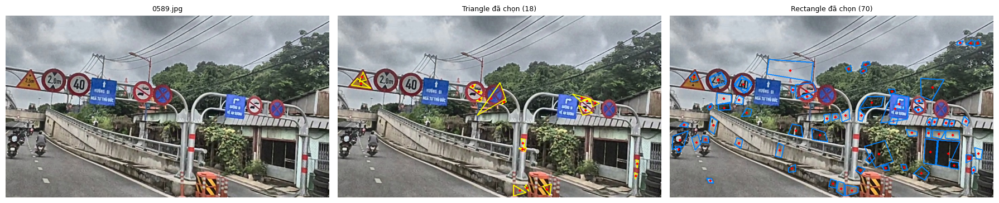

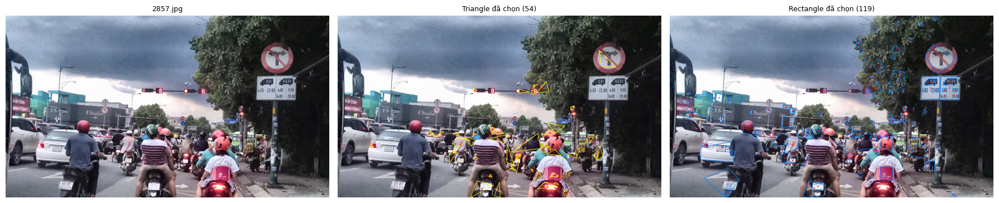

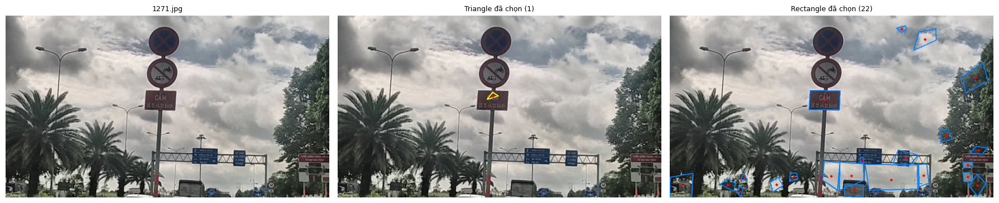

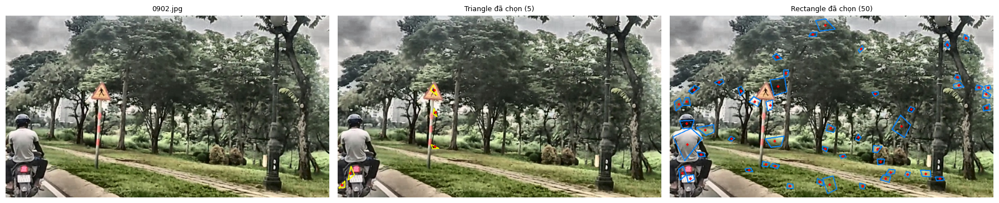

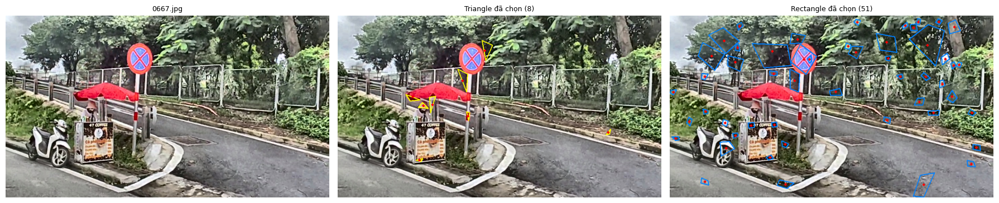

In [43]:
for img, title in zip(survey_images, survey_titles):
    gray = preprocess_for_polygon(img)
    triangles  = detect_polygons(gray, image_bgr=img, target_sides=3, **best_triangle_params)
    rectangles = detect_polygons(gray, image_bgr=img, target_sides=4, **best_rectangle_params)

    vis_tri  = draw_polygons(img, triangles,  color=(0, 255, 255))
    vis_rect = draw_polygons(img, rectangles, color=(255, 128, 0))

    show_images(
        [img, vis_tri, vis_rect],
        [title, f"Triangle đã chọn ({len(triangles)})", f"Rectangle đã chọn ({len(rectangles)})"],
        figsize=(18, 5)
    )

## 6.4. Áp dụng lên toàn bộ dataset & xuất JSON triangle + rectangle

In [44]:
print(f"Bắt đầu xử lý {len(all_img_paths_full)} ảnh (triangle + rectangle)")

for path in all_img_paths_full:
    img = cv2.imread(str(path))
    if img is None:
        continue
    gray = preprocess_for_polygon(img)

    triangles  = detect_polygons(gray, image_bgr=img, target_sides=3, **best_triangle_params)
    rectangles = detect_polygons(gray, image_bgr=img, target_sides=4, **best_rectangle_params)

    with open(TRIANGLE_JSON_DIR / f"{path.stem}.json", "w", encoding="utf-8") as f:
        json.dump(triangles, f)
    with open(RECTANGLE_JSON_DIR / f"{path.stem}.json", "w", encoding="utf-8") as f:
        json.dump(rectangles, f)

print(f"Đã xuất JSON triangle  -> {TRIANGLE_JSON_DIR}")
print(f"Đã xuất JSON rectangle -> {RECTANGLE_JSON_DIR}")

Bắt đầu xử lý 2532 ảnh (triangle + rectangle)
Đã xuất JSON triangle  -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\triangles
Đã xuất JSON rectangle -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\rectangles


# 7. Gộp kết quả cho Task 3 & lưu config

Task 4 (ROI extraction) chỉ nên đọc **1 nguồn JSON duy nhất** cho toàn bộ Task 3, thay vì tự merge 3 thư mục circles/, triangles/, rectangles/. Bước này gộp lại theo từng ảnh, giữ nguyên field source để Task 4 (hoặc bước debug sau này) vẫn biết ứng viên đến từ nhánh nào.

## 7.1. Gộp 3 JSON (circle/triangle/rectangle) thành 1 JSON/ảnh

In [45]:
merged_summary = {}
for path in all_img_paths_full:
    stem = path.stem
    merged = []
    for json_dir in [CIRCLE_JSON_DIR, TRIANGLE_JSON_DIR, RECTANGLE_JSON_DIR]:
        json_path = json_dir / f"{stem}.json"
        if json_path.exists():
            with open(json_path, "r", encoding="utf-8") as f:
                merged.extend(json.load(f))

    with open(MERGED_JSON_DIR / f"{stem}.json", "w", encoding="utf-8") as f:
        json.dump(merged, f)
    merged_summary[path.name] = len(merged)

print(f"Đã gộp -> {MERGED_JSON_DIR}")
print(f"Trung bình box/ảnh (circle+triangle+rectangle): {sum(merged_summary.values())/len(merged_summary):.2f}")

Đã gộp -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task3_shape\merged
Trung bình box/ảnh (circle+triangle+rectangle): 323.12


## 7.2. Kiểm tra định tính kết quả gộp trên 5 ảnh mẫu

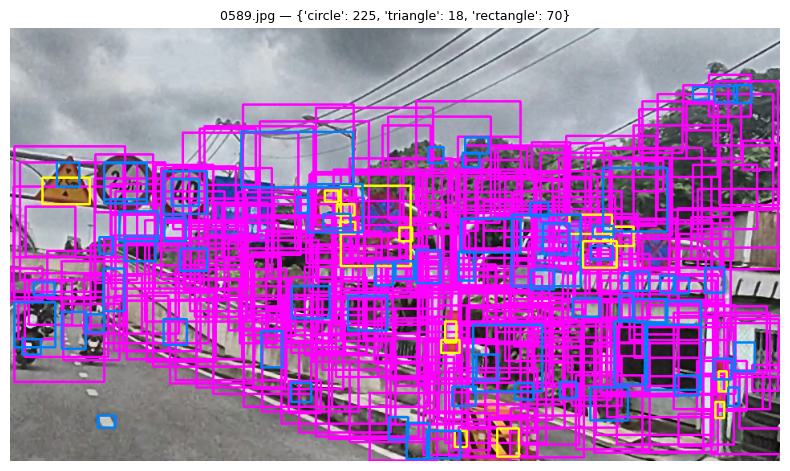

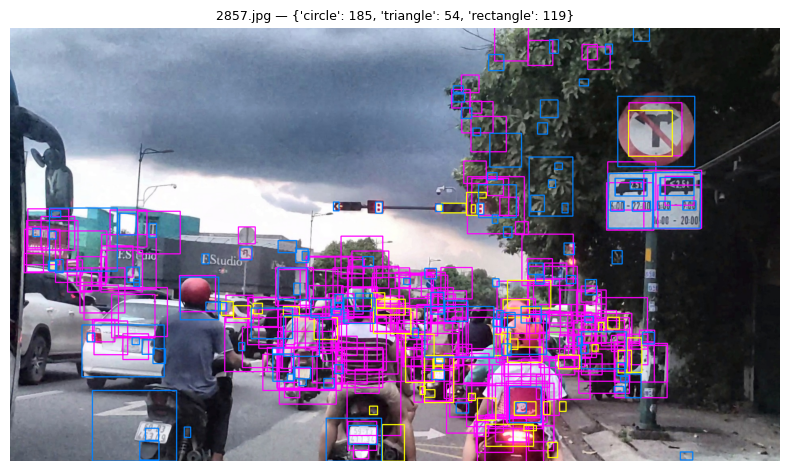

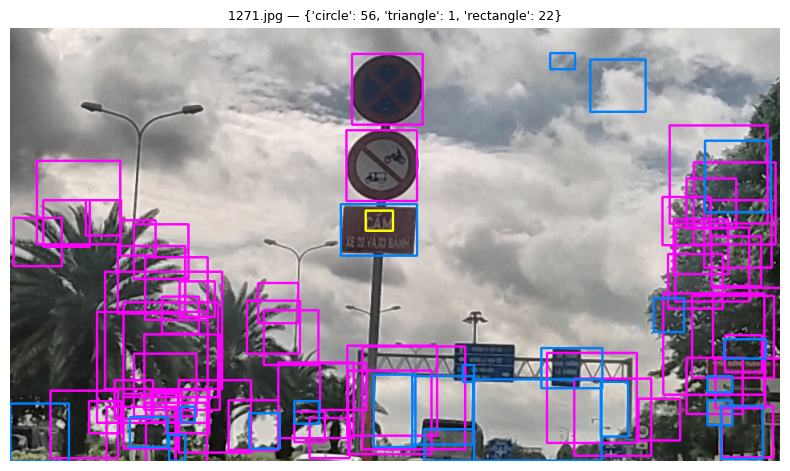

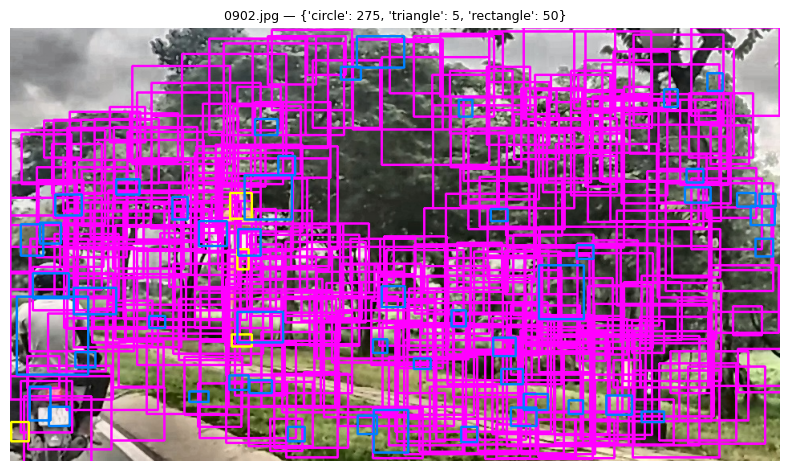

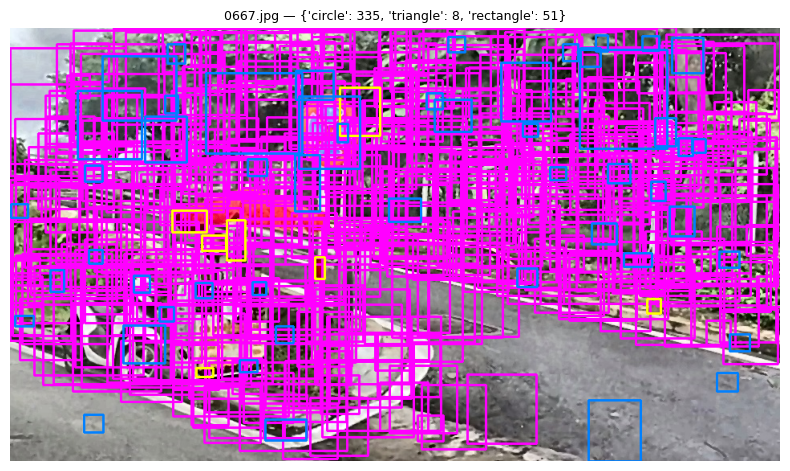

In [46]:
for img, title in zip(survey_images, survey_titles):
    stem = Path(title).stem
    json_path = MERGED_JSON_DIR / f"{stem}.json"
    with open(json_path, "r", encoding="utf-8") as f:
        merged = json.load(f)

    vis = img.copy()
    color_by_source = {"circle": (255, 0, 255), "triangle": (0, 255, 255), "rectangle": (255, 128, 0)}
    for item in merged:
        x, y, w, h = item["bounding_box"]
        c = color_by_source.get(item["source"], (0, 255, 0))
        cv2.rectangle(vis, (x, y), (x + w, y + h), c, 2)

    n_by_source = {s: sum(1 for m in merged if m["source"] == s) for s in ["circle", "triangle", "rectangle"]}
    show_images([vis], [f"{title} — {n_by_source}"], figsize=(8, 5))

## 7.3. Lưu toàn bộ tham số vào `config.yaml`

In [47]:
with open(CONFIG_PATH, "r", encoding="utf-8") as f:
    cfg = yaml.safe_load(f)

cfg.setdefault("task3_shape", {})
cfg["task3_shape"]["circle"]    = best_hough_params    
cfg["task3_shape"]["triangle"]  = best_triangle_params    
cfg["task3_shape"]["rectangle"] = best_rectangle_params  

save_config(cfg, CONFIG_PATH)
print("Đã lưu config.yaml -- task3_shape:")
print(json.dumps(cfg["task3_shape"], indent=2, ensure_ascii=False))


Đã lưu config.yaml -- task3_shape:
{
  "circle": {
    "dp": 1.2,
    "min_dist": 25,
    "param1": 120,
    "param2": 40,
    "min_radius": 6,
    "max_radius": 74
  },
  "ellipse": {
    "min_area": 100,
    "max_area_ratio": 0.3,
    "min_extent": 0.85,
    "max_aspect": 2.2,
    "min_color_ratio": null
  },
  "rectangle": {
    "approx_eps_ratio": 0.1,
    "min_area": 200,
    "min_extent": 0.65,
    "max_aspect": 2.5,
    "angle_tol": 45
  },
  "triangle": {
    "approx_eps_ratio": 0.12,
    "min_area": 150,
    "min_angle_deg": 12,
    "max_side_ratio": 3.0,
    "min_red_ratio": 0.05,
    "min_yellow_fill": 0.0
  }
}
